In [66]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
import warnings
warnings.filterwarnings("ignore")

In [67]:
datadir = ''
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv('../data/driving_log_bak.csv', names = columns)
pd.set_option('display.max_colwidth', None)
print("data.shape: ", data.shape)
data.head()

data.shape:  (2412, 7)


,center,left,right,steering,throttle,reverse,speed
0,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\center_2023_04_20_15_54_34_344.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\left_2023_04_20_15_54_34_344.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\right_2023_04_20_15_54_34_344.jpg,0.0,0.0,0,0.000083
1,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\center_2023_04_20_15_54_34_456.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\left_2023_04_20_15_54_34_456.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\right_2023_04_20_15_54_34_456.jpg,0.0,0.0,0,0.000079
2,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\center_2023_04_20_15_54_34_576.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\left_2023_04_20_15_54_34_576.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\right_2023_04_20_15_54_34_576.jpg,0.0,0.0,0,0.000081
3,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\center_2023_04_20_15_54_34_680.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\left_2023_04_20_15_54_34_680.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\right_2023_04_20_15_54_34_680.jpg,0.0,0.0,0,0.000079
4,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\center_2023_04_20_15_54_34_783.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\left_2023_04_20_15_54_34_783.jpg,C:\AI\TrainingBasic\?Unity??????????????TensorFlow\SelfdrivingCar\data\IMG_bak\right_2023_04_20_15_54_34_783.jpg,0.0,0.0,0,0.000079


In [68]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_04_20_15_54_34_344.jpg,left_2023_04_20_15_54_34_344.jpg,right_2023_04_20_15_54_34_344.jpg,0.0,0.0,0,0.000083
1,center_2023_04_20_15_54_34_456.jpg,left_2023_04_20_15_54_34_456.jpg,right_2023_04_20_15_54_34_456.jpg,0.0,0.0,0,0.000079
2,center_2023_04_20_15_54_34_576.jpg,left_2023_04_20_15_54_34_576.jpg,right_2023_04_20_15_54_34_576.jpg,0.0,0.0,0,0.000081
3,center_2023_04_20_15_54_34_680.jpg,left_2023_04_20_15_54_34_680.jpg,right_2023_04_20_15_54_34_680.jpg,0.0,0.0,0,0.000079
4,center_2023_04_20_15_54_34_783.jpg,left_2023_04_20_15_54_34_783.jpg,right_2023_04_20_15_54_34_783.jpg,0.0,0.0,0,0.000079


In [69]:
num_bins = 25
samples_per_bin = 200
hist, bins = np.histogram(data['steering'], num_bins)
print(bins)

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


total data:

 2412


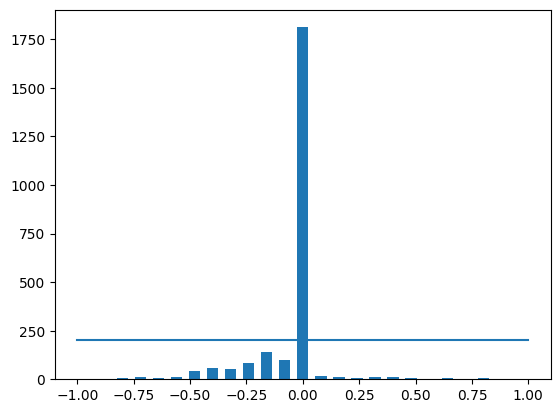

In [70]:
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))
print('total data:', len(data))

In [71]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 1611
remaining: 801


total data: 801


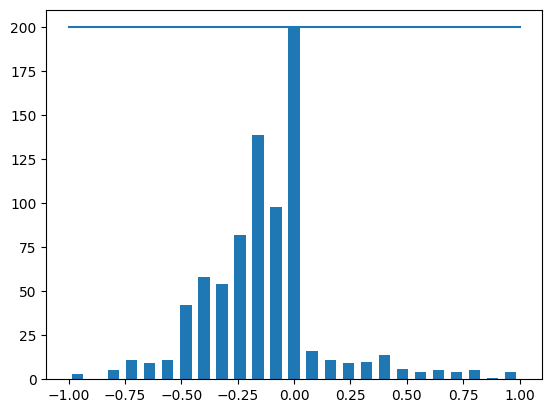

In [72]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), \
(samples_per_bin, samples_per_bin))
print('total data:', len(data))

In [73]:
print(data.iloc[1])

center      center_2023_04_20_15_54_36_348.jpg
left          left_2023_04_20_15_54_36_348.jpg
right        right_2023_04_20_15_54_36_348.jpg
steering                                   0.0
throttle                                   0.0
reverse                                      0
speed                                 0.000079
Name: 17, dtype: object


In [74]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
 
image_paths, steerings = load_img_steering("../data/img_bak", data)

In [75]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 1922
Valid Samples: 481


Text(0.5, 1.0, 'Validation set')

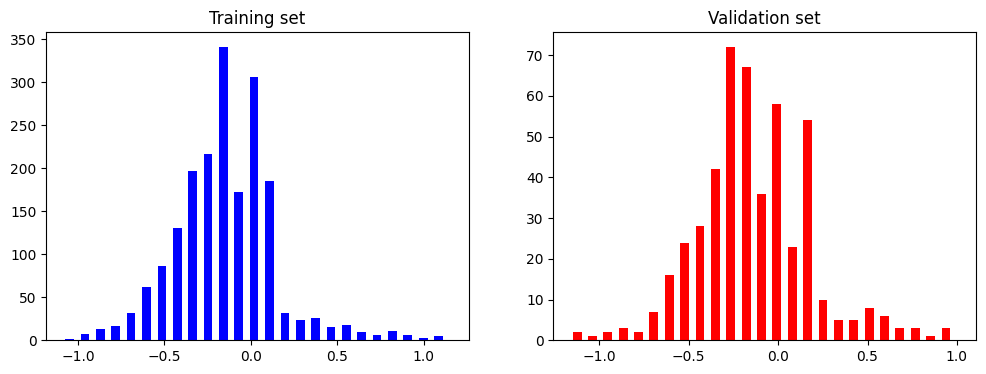

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

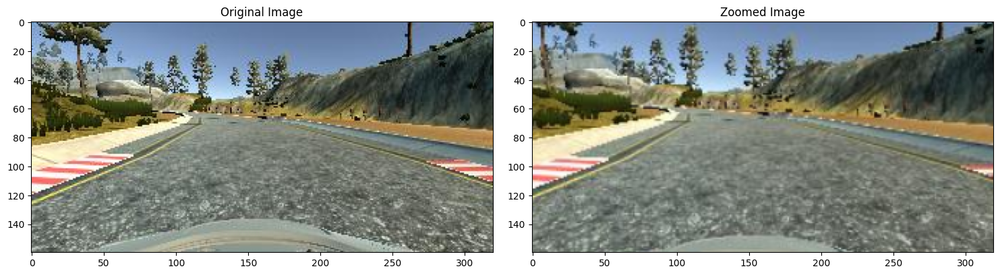

In [77]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

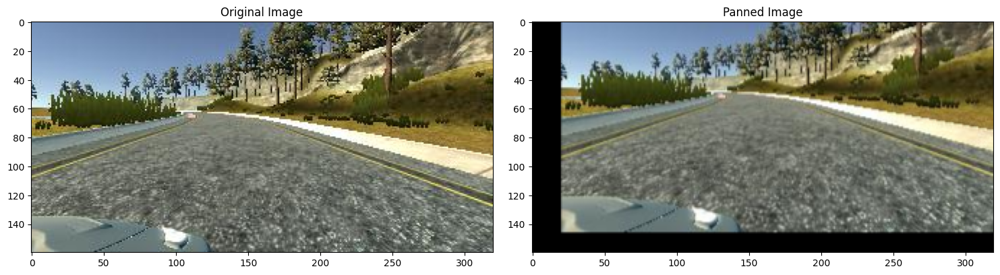

In [78]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

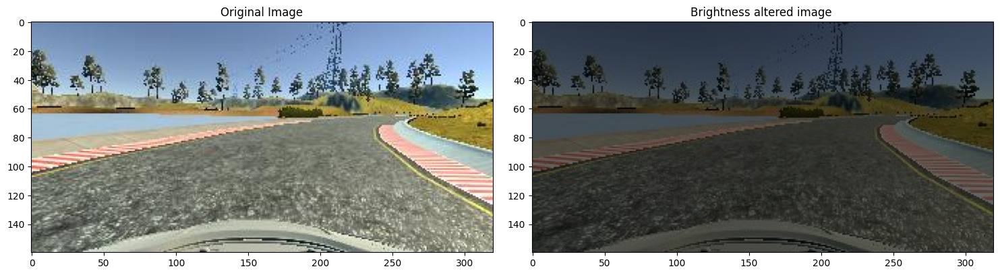

In [79]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.5456934')

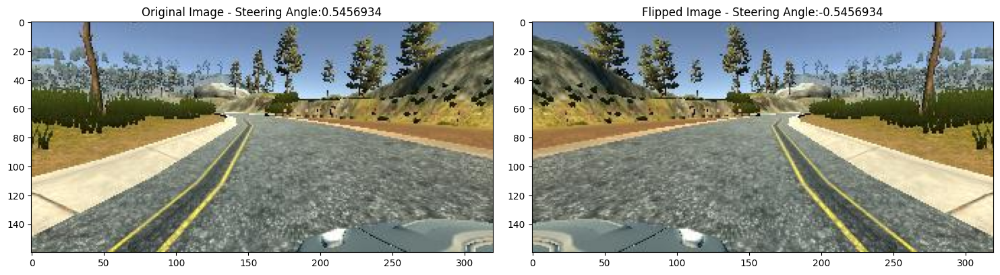

In [80]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

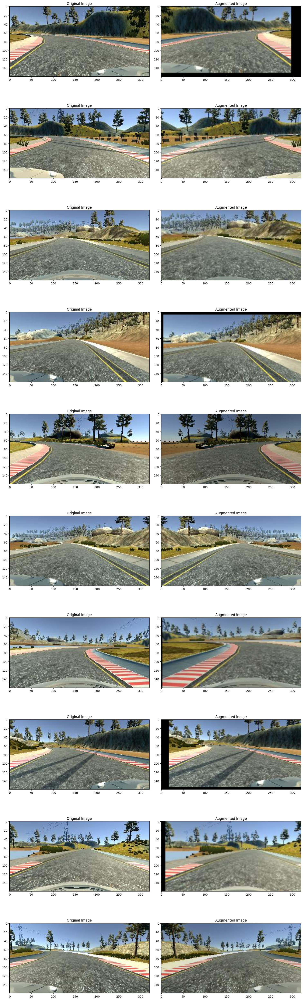

In [81]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

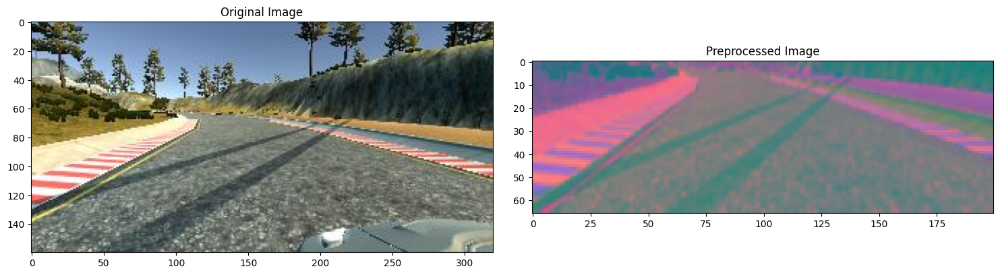

In [82]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

Text(0.5, 1.0, 'Preprocessed Image')

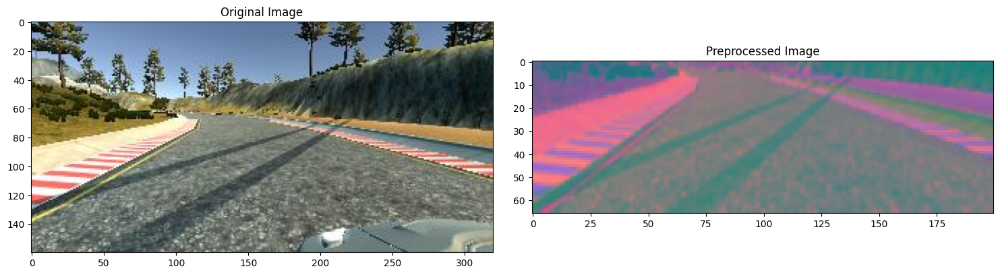

In [83]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [84]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) 

Text(0.5, 1.0, 'Validation Image')

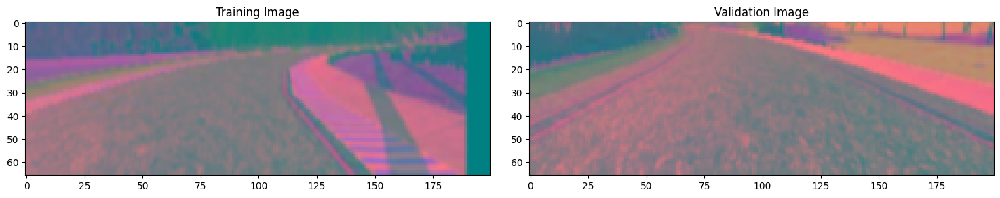

In [85]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [86]:
def nvidiaModel():
  model = Sequential()
  model.add(Convolution2D(24,(5,5),strides=(2,2),input_shape=(66,200,3),activation="elu"))
  model.add(Convolution2D(36,(5,5),strides=(2,2),activation="elu"))
  model.add(Convolution2D(48,(5,5),strides=(2,2),activation="elu")) 
  model.add(Convolution2D(64,(3,3),activation="elu"))   
  model.add(Convolution2D(64,(3,3),activation="elu"))
  model.add(Dropout(0.5))
  
  model.add(Flatten())
  
  model.add(Dense(100,activation="elu"))
  model.add(Dropout(0.5))
  
  model.add(Dense(50,activation="elu"))
  model.add(Dropout(0.5))
  
  model.add(Dense(10,activation="elu"))
  model.add(Dropout(0.5))
  
  model.add(Dense(1))
  model.compile(optimizer=Adam(lr=1e-3),loss="mse")
  
  return model

In [87]:
model = nvidiaModel()
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_11 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_12 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_13 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_14 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 dropout_8 (Dropout)         (None, 1, 18, 64)         0         
                                                                 
 flatten_2 (Flatten)         (None, 1152)             

In [88]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Num GPUs Available:  1


In [89]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 [==============================] - 90s 298ms/step - loss: 0.1441 - val_loss: 0.0870
Epoch 2/10
300/300 [==============================] - 79s 264ms/step - loss: 0.0904 - val_loss: 0.0743
Epoch 3/10
300/300 [==============================] - 78s 261ms/step - loss: 0.0872 - val_loss: 0.0695
Epoch 4/10
300/300 [==============================] - 78s 261ms/step - loss: 0.0837 - val_loss: 0.0693
Epoch 5/10
300/300 [==============================] - 86s 288ms/step - loss: 0.0827 - val_loss: 0.0682
Epoch 6/10
300/300 [==============================] - 99s 331ms/step - loss: 0.0803 - val_loss: 0.0662
Epoch 7/10
300/300 [==============================] - 83s 276ms/step - loss: 0.0799 - val_loss: 0.0689
Epoch 8/10
300/300 [==============================] - 87s 290ms/step - loss: 0.0787 - val_loss: 0.0652
Epoch 9/10
300/300 [==============================] - 79s 264ms/step - loss: 0.0784 - val_loss: 0.0631
Epoch 10/10
300/300 [==============================] - 87s 292ms/step - l

Text(0.5, 0, 'Epoch')

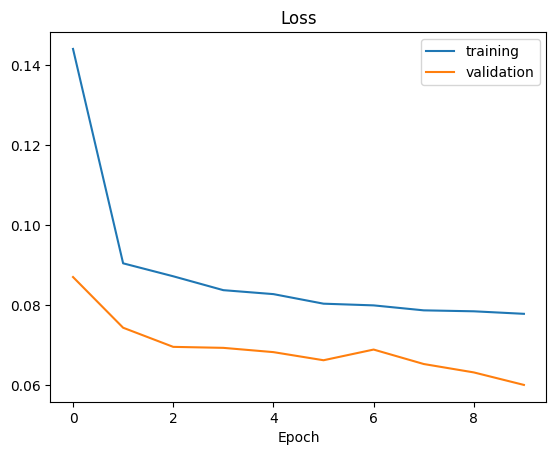

In [90]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [91]:
model.save('../model/model.h5')